In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
%%HTML
<style type="text/css">
    table.dataframe td, table.dataframe th {
        border-style: solid;
    }
</style>

In [3]:
bank = pd.read_csv('train.csv', sep=';')

In [4]:
pd.set_option('display.max_columns', None)

In [5]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [6]:
bank.shape

(45211, 17)

## Input variables:

### Bank client data:

1. age: Umur (numeric)
1. job: Tipe pekerjaan (categorical)
1. marital: Status pernikahan (categorical)
1. education: Pendidikan terakhir (categorical)
1. default: Apakah nasabah punya status (binary)
1. balance: rata-rata saldo tahunan (dalam euro) (numeric)
1. housing: Apakah nasabah punya cicilan rumah? (binary)
1. loan: Apakah nasabah punya pinjaman pribadi? (binary)

### Related with the last contact of the current campaign:
1. contact: Jenis komunikasi (categorical)
1. month: Bulan kontak terakhir (categorical)
1. day: Hari terakhir dikontak pada bulan ini (numeric)
1. duration: Durasi kontak terakhir (dalam detik) (numeric)

### Other attributes:
1. campaign: Total kontak yang sudah dilakukan untuk nasabah tersebut selama kampanya dilakukan (termasuk kontak terakhir) (numeric)
1. pdays: Jumlah hari yang berlalu dari terakhir kali nasabah dihubungi dari kampanye sebelumnya (numeric)
1. previous: Jumlah kontak yang dilakaukan pada nasabah tersebut dalam kampanye sebelumnya (numeric)
1. poutcome: Hasil dari kampanye marketing sebelumnya (categorical)

### Output variable (desired target):
1. y - Apakah klien berlangganan deposito berjangka? (binary)

In [7]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [8]:
bank.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

Tidak ada NaN, tapi coba kita lihat isi dari kolom objek

In [9]:
bank.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


Duration dan previous punya minimal nilai 0, kita lihat apakah menandakan sesuatu.<br> -1 pada pdays artinya klien belum pernah dihubungi pada kampanye sebelum ini, maka untuk analisa data akan kita jadikan kolom kategorik dimana -1 = no, selebihnya yes. 

In [10]:
bank[bank.duration < 8]['y'].value_counts()

no    180
Name: y, dtype: int64

In [11]:
bank[bank.previous == 0]['y'].value_counts()

no     33570
yes     3384
Name: y, dtype: int64

Bisa dilihat dari data di atas bahwa duration 0 dan di bawah 8 pasti no, namun tidak berlaku untuk previous, maka bisa disimpulkan bahwa duration terlalu bias terhadap target. Bisa di drop ketika akan modeling

In [12]:
bank.pdays = np.where(bank.pdays == -1, 'no', 'yes')

In [13]:
bank.describe(exclude=np.number)

,job,marital,education,default,housing,loan,contact,month,pdays,poutcome,y
count,45211,45211,45211,45211,45211,45211,45211,45211,45211,45211,45211
unique,12,3,4,2,2,2,3,12,2,4,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,no,unknown,no
freq,9732,27214,23202,44396,25130,37967,29285,13766,36954,36959,39922


In [14]:
objek = bank.columns[bank.dtypes == 'O']
for col in objek:
    p = bank[col].value_counts(normalize=True)*100
    
    print(col)
    print()
    print(p)
    print('-'*40)

job

blue-collar      21.525735
management       20.919688
technician       16.803433
admin.           11.437482
services          9.188029
retired           5.007631
self-employed     3.492513
entrepreneur      3.289023
unemployed        2.882042
housemaid         2.742695
student           2.074716
unknown           0.637013
Name: job, dtype: float64
----------------------------------------
marital

married     60.193316
single      28.289576
divorced    11.517109
Name: marital, dtype: float64
----------------------------------------
education

secondary    51.319369
tertiary     29.419831
primary      15.153392
unknown       4.107407
Name: education, dtype: float64
----------------------------------------
default

no     98.197341
yes     1.802659
Name: default, dtype: float64
----------------------------------------
housing

yes    55.583818
no     44.416182
Name: housing, dtype: float64
----------------------------------------
loan

no     83.977351
yes    16.022649
Name: loan, dt

job, education, contact, poutcome punya nilai unknown<br>
- job        0.637013 %<br>
- education  4.107407 %<br>
- contact    28.798301 %<br>
- poutcome   81.747805 %<br>

Untuk analisa, unknown pada kolom job, education dan contact akan diisi dengan mode, Unknown pada kolom poutcome akan didrop. 

In [15]:
unknown = 'job education contact'.split()
for i in unknown:
    bank[i] = np.where(bank[i] == 'unknown', bank[i].mode(), bank[i])

for i in unknown:
    print(i)
    print(bank[i].value_counts(normalize=True))
    print()

job
blue-collar      0.221627
management       0.209197
technician       0.168034
admin.           0.114375
services         0.091880
retired          0.050076
self-employed    0.034925
entrepreneur     0.032890
unemployed       0.028820
housemaid        0.027427
student          0.020747
Name: job, dtype: float64

education
secondary    0.554268
tertiary     0.294198
primary      0.151534
Name: education, dtype: float64

contact
cellular     0.935724
telephone    0.064276
Name: contact, dtype: float64



In [16]:
bank_p = bank[bank.poutcome != 'unknown']
bank_p.poutcome.value_counts()

failure    4901
other      1840
success    1511
Name: poutcome, dtype: int64

## Cek Target

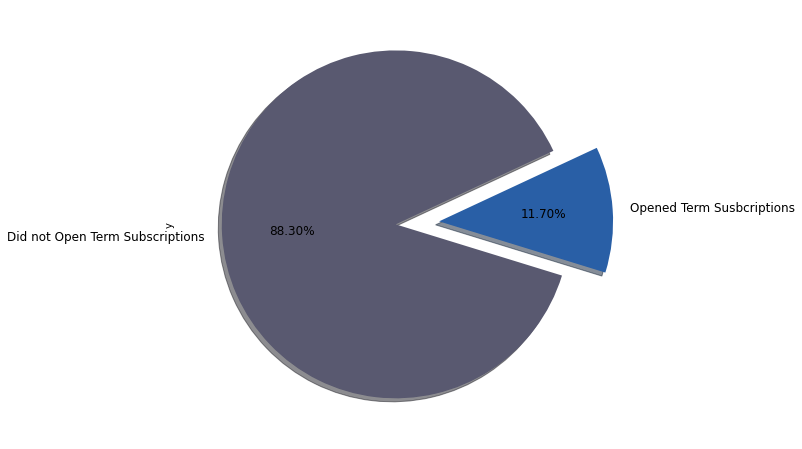

In [17]:
colors = ['#595970', '#295FA6']
labels ="Did not Open Term Subscriptions", "Opened Term Susbcriptions"

plt.figure(figsize =(8,8))
bank.y.value_counts().plot.pie(explode=[0,0.25], autopct='%1.2f%%', shadow=True, 
                                             labels=labels, fontsize=12, startangle=25, colors = colors)
plt.show()

Data target yang tersedia sangat imbalance, perlu menggunakan teknik balancing agar model tidak bias terhadap no

In [18]:
bank_y = bank[bank.y == 'yes']
bank_n = bank[bank.y == 'no']

> ## Job vs Subscription

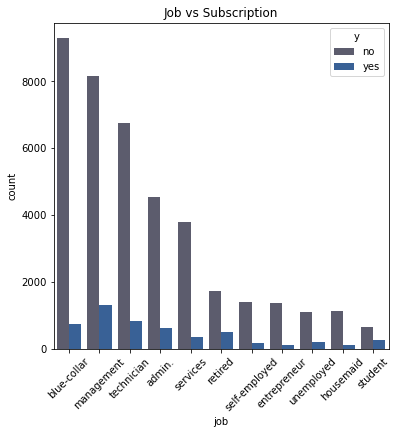

In [19]:
plt.figure(figsize =(6,6))
sns.countplot(x='job', hue="y", data=bank, order =bank.job.value_counts().index, palette= colors)
plt.xticks(rotation=45)
plt.title('Job vs Subscription')
plt.show()

In [20]:
bank.groupby('job')['y'].value_counts(normalize=True)*100

job            y  
admin.         no     87.797331
               yes    12.202669
blue-collar    no     92.594810
               yes     7.405190
entrepreneur   no     91.728312
               yes     8.271688
housemaid      no     91.209677
               yes     8.790323
management     no     86.244449
               yes    13.755551
retired        no     77.208481
               yes    22.791519
self-employed  no     88.157061
               yes    11.842939
services       no     91.116996
               yes     8.883004
student        no     71.321962
               yes    28.678038
technician     no     88.943004
               yes    11.056996
unemployed     no     84.497314
               yes    15.502686
Name: y, dtype: float64

Management, techinician dan blue-collar lebih banyak yang subscribed dengan yang terbanyak subscribed ada di management. Sedangkan blue-collar paling banyak ditawarkan oleh telemarketer. Namun, rasio penawaran diterima lebih banyak pada student dan retired.


> ## Age

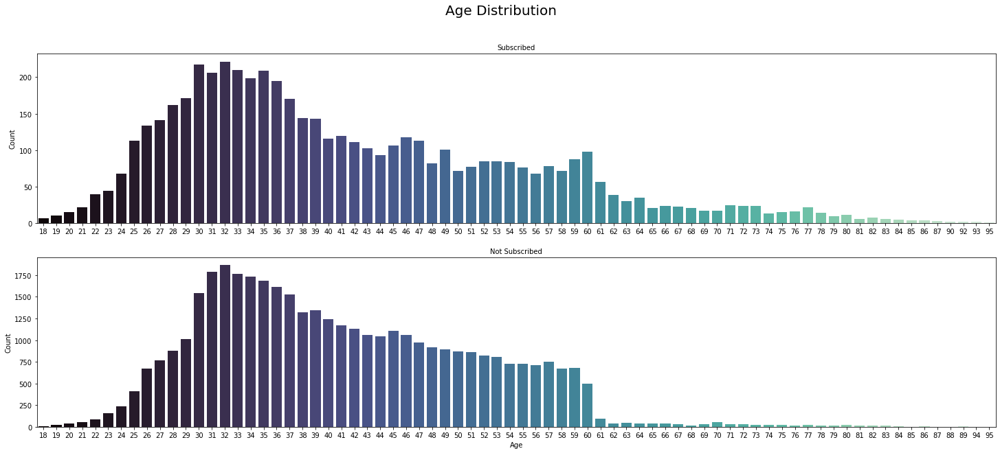

In [21]:
plt.figure(figsize=(25,10))

plt.suptitle('Age Distribution', fontsize=20)

plt.subplot(2,1,1)
sns.countplot(x = 'age', data = bank_y, palette = 'mako')
plt.xlabel(' ')
plt.ylabel('Count', fontsize=10)
plt.title('Subscribed', fontsize=10)

plt.subplot(2,1,2)
sns.countplot(x = 'age', data = bank_n, palette = 'mako')
plt.xlabel('Age', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Not Subscribed', fontsize=10)

plt.show()

- Terlihat nasabah paling banyak di usia 32.
- Nasabah yang subscribe paling banyak berada di sekitar usia 30-36 tahun.
- Nasabah 60 tahun ke atas cenderung untuk subscribe.

> ## Job vs Balance

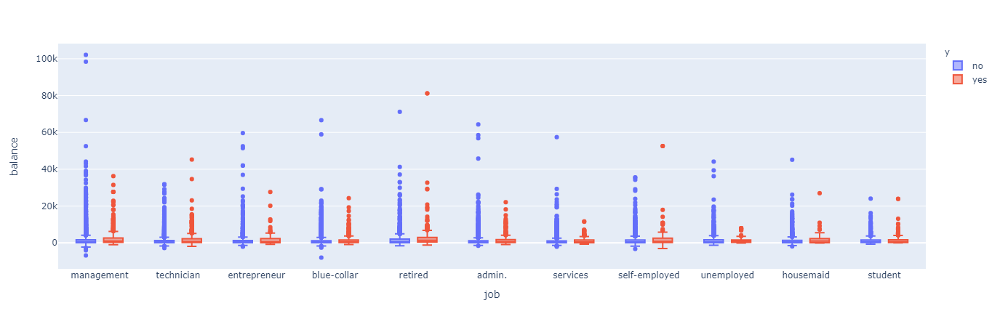

In [22]:
bank.dataframeName = 'bank'
fig = px.box(bank, x="job", y="balance", color="y")
fig.update_traces() # or "inclusive", or "linear" by default
fig.show()

Perbedaan balance dari tiap job sangat jauh (terlihat banyak outliers juga), untuk yang balance terlalu tinggi saya cut dulu.

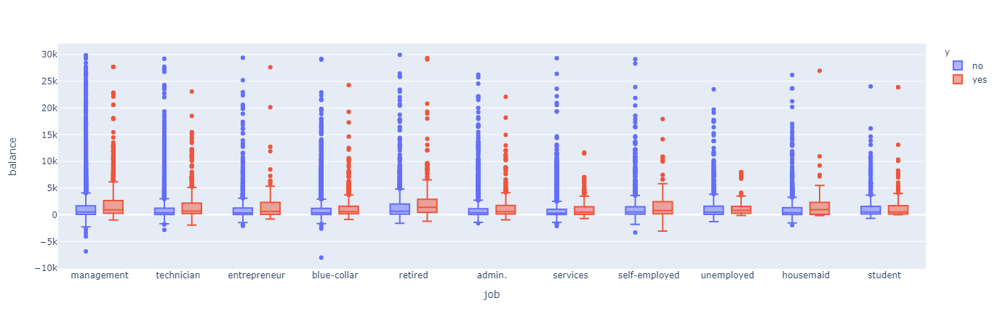

In [23]:
bank4 = bank[bank.balance < 30001]
bank4.dataframeName = 'bank4'
fig = px.box(bank4, x="job", y="balance", color="y")
fig.update_traces()
fig.show()

Sudah mulai terlihat boxnya, next saya buang outliers. Di sini kita bisa lihat bahwa ragam balance sangat tersebar dalam data.

In [24]:
bank2 = bank.copy()
Q1 = bank2['balance'].quantile(0.25)
Q3 = bank2['balance'].quantile(0.75)
IQR = Q3 - Q1     

filter = (bank2['balance'] >= Q1 - 1.5 * IQR) & (bank2['balance'] <= Q3 + 1.5 *IQR)
bank2=bank2.loc[filter]

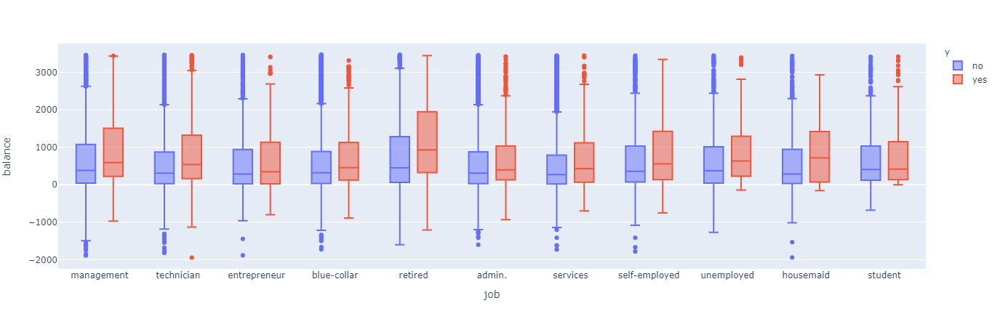

In [25]:
bank2.dataframeName = 'bank2'
fig = px.box(bank2, x="job", y="balance", color="y")
fig.update_traces() # or "inclusive", or "linear" by default
fig.show()

Di sini terlihat jelas bahwa nasabah dengan rata-rata balance yang negatif pun ada yang subscribe, sedangkan di atas, nasabah dengan balance tertinggi tidak subscribe. Mayoritas balance berada di kisaran 500-1500.<br> Menariknya, semua student dengan balance negatif tidak ada yang subscribe.

> ## Education

Text(0.5, 1.0, 'Education')

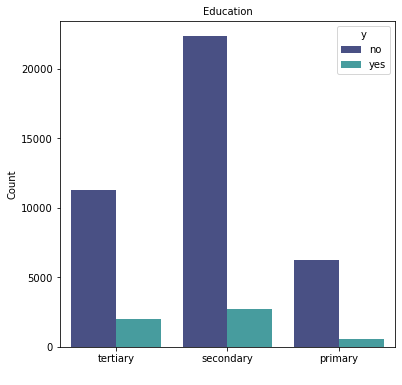

In [26]:
plt.figure(figsize =(6,6))
sns.countplot(x = 'education', hue='y', data = bank, palette = 'mako')
plt.xlabel(' ')
plt.ylabel('Count', fontsize=10)
plt.title('Education', fontsize=10)

In [27]:
bank.groupby('education').y.value_counts(normalize=True)*100

education  y  
primary    no     91.373522
           yes     8.626478
secondary  no     89.217447
           yes    10.782553
tertiary   no     84.993610
           yes    15.006390
Name: y, dtype: float64

Nasabah paling banyak berpendidikan secondary, namun rasio subscribe tertingi ada di tertiary.

> ## Marital

Text(0.5, 1.0, 'Marital')

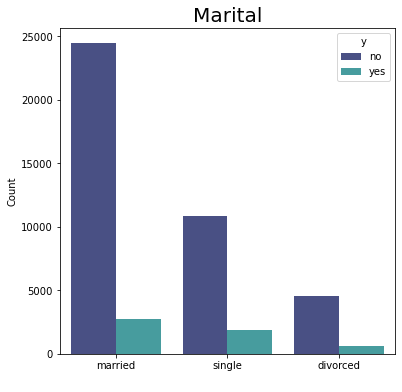

In [28]:
plt.figure(figsize =(6,6))
sns.countplot(x = 'marital', hue='y', data = bank, palette = 'mako')
plt.xlabel(' ')
plt.ylabel('Count', fontsize=10)
plt.title('Marital', fontsize=20)

In [29]:
bank.groupby('marital').y.value_counts(normalize=True)*100

marital   y  
divorced  no     88.054542
          yes    11.945458
married   no     89.876534
          yes    10.123466
single    no     85.050821
          yes    14.949179
Name: y, dtype: float64

Mayoritas nasabah sudah menikah, namun nasabah yang masih single berpotensi lebih besar untuk subscribe.

> ## Loan

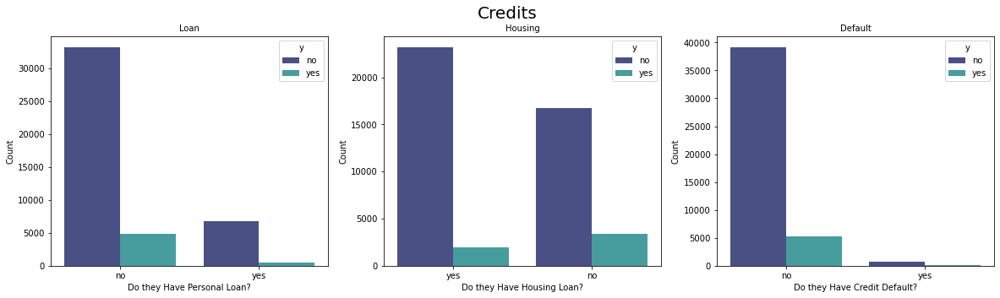

In [30]:
plt.figure(figsize =(20,5))

plt.suptitle('Credits', fontsize=20)

plt.subplot(1,3,1)
sns.countplot(x = 'loan', hue='y', data = bank, palette = 'mako')
plt.xlabel('Do they Have Personal Loan?')
plt.ylabel('Count', fontsize=10)
plt.title('Loan', fontsize=10)

plt.subplot(1,3,2)
sns.countplot(x = 'housing', hue='y', data = bank, palette = 'mako')
plt.xlabel('Do they Have Housing Loan?')
plt.ylabel('Count', fontsize=10)
plt.title('Housing', fontsize=10)

plt.subplot(1,3,3)
sns.countplot(x = 'default', hue='y', data = bank, palette = 'mako')
plt.xlabel('Do they Have Credit Default?')
plt.ylabel('Count', fontsize=10)
plt.title('Default', fontsize=10)
plt.show()

In [31]:
bank.groupby('housing').y.value_counts(normalize=True)*100

housing  y  
no       no     83.297645
         yes    16.702355
yes      no     92.300040
         yes     7.699960
Name: y, dtype: float64

Tidak heran lagi nasabah yang tidak punya cicilan/hutang/masalah kredit lebih cenderung untuk subscribe. Namun menariknya, nasabah yang punya cicilan rumah juga ada yang subscribe (sekitar 7%). Sepertinya ini terjadi karena cicilan rumah relatif stabil, jadi mereka bisa memperkirakan uang yang harus disisihkan untuk deposito.

> ## Month

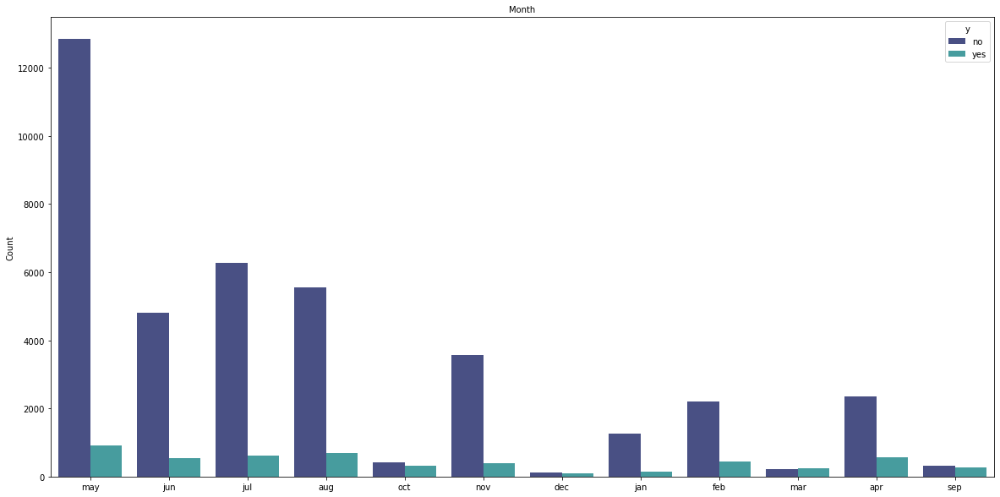

In [32]:
plt.figure(figsize =(20,10))
sns.countplot(x = 'month', hue='y', data = bank, palette = 'mako')
plt.xlabel('')
plt.ylabel('Count', fontsize=10)
plt.title('Month', fontsize=10)
plt.show()

In [33]:
bank.groupby('month').y.value_counts(normalize=True)*100

month  y  
apr    no     80.320600
       yes    19.679400
aug    no     88.986714
       yes    11.013286
dec    no     53.271028
       yes    46.728972
feb    no     83.352208
       yes    16.647792
jan    no     89.878831
       yes    10.121169
jul    no     90.906454
       yes     9.093546
jun    no     89.777195
       yes    10.222805
mar    yes    51.991614
       no     48.008386
may    no     93.280546
       yes     6.719454
nov    no     89.848866
       yes    10.151134
oct    no     56.233062
       yes    43.766938
sep    no     53.540587
       yes    46.459413
Name: y, dtype: float64

Nasabah paling banyak dikontak pada bulan Mei, dan sedikit sekali pada bulan Oktober, Maret, September dan Desember. Namun di bulan yang sedikit tersebut rasio subscribenya hampir sama dengan yang tidak, bahkan pada bulan Maret jumlah nasabah yang subscribe melebihi yang tidak. Sebaliknya, di bulan Mei rasio subscribe paling kecil di banding bulan lainnya (6.7%)

> ## Campaign

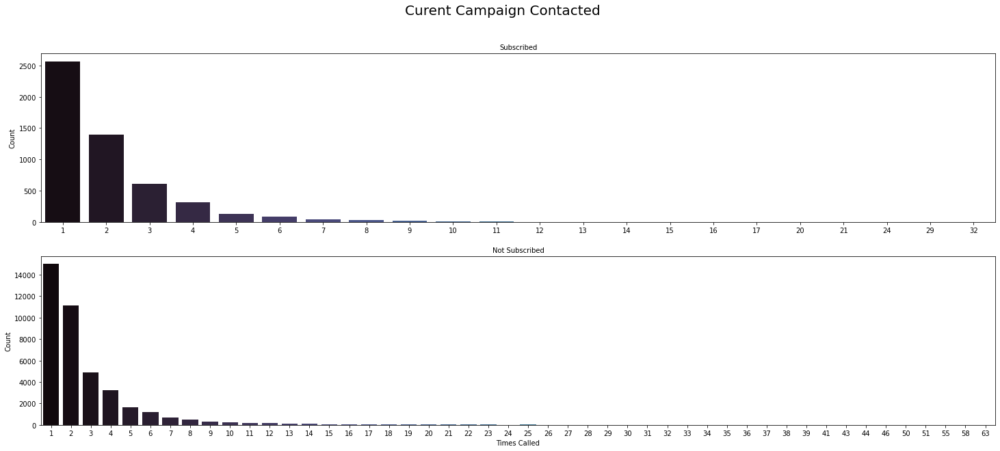

In [34]:
plt.figure(figsize=(25,10))

plt.suptitle('Curent Campaign Contacted', fontsize=20)

plt.subplot(2,1,1)
sns.countplot(x = 'campaign', data = bank_y, palette = 'mako')
plt.xlabel(' ')
plt.ylabel('Count', fontsize=10)
plt.title('Subscribed', fontsize=10)

plt.subplot(2,1,2)
sns.countplot(x = 'campaign', data = bank_n, palette = 'mako')
plt.xlabel('Times Called', fontsize=10)
plt.ylabel('Count', fontsize=10)
plt.title('Not Subscribed', fontsize=10)

plt.show()

In [35]:
bank_y[bank_y.campaign > 20]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
3331,50,entrepreneur,married,primary,no,461,yes,no,cellular,15,may,651,32,no,0,unknown,yes
16637,38,entrepreneur,married,secondary,no,593,yes,yes,cellular,24,jul,1484,24,no,0,unknown,yes
17873,46,housemaid,married,secondary,no,271,yes,no,cellular,30,jul,1013,29,no,0,unknown,yes
30917,28,technician,single,tertiary,no,4987,no,no,cellular,9,feb,253,21,no,0,unknown,yes


In [36]:
bank_n[bank_n.campaign > 50]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
4299,30,management,single,tertiary,no,358,yes,no,cellular,19,may,88,51,no,0,unknown,no
4330,45,management,married,secondary,no,9051,yes,no,cellular,19,may,124,63,no,0,unknown,no
5073,35,technician,married,secondary,no,432,yes,no,cellular,21,may,1094,55,no,0,unknown,no
11914,24,technician,single,primary,no,126,yes,no,cellular,20,jun,10,58,no,0,unknown,no


Nasabah yang subscribe paling banyak dihubungi sejumlah 32 kali dan yang tidak subscribe paling banyak dihubungi sejumlah 63 kali. Bahkan nasabah yang tidak subscribe ada yang dihubungi sebanyak 55 kali dengan durasi 18 menit. Ini sangat membuang waktu dan biaya.

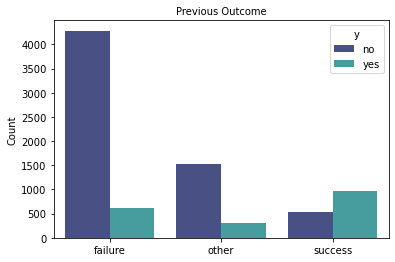

In [37]:
sns.countplot(x = 'poutcome', hue='y', data = bank_p, palette = 'mako')
plt.xlabel('')
plt.ylabel('Count', fontsize=10)
plt.title('Previous Outcome', fontsize=10)
plt.show()

Nasabah yang pada kampanye marketing sebelumnya sukses, lebih besar kemungkinannya untuk sukses di kampanye berikutnya.  

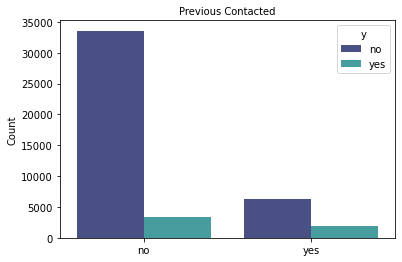

In [38]:
sns.countplot(x = 'pdays', hue='y', data = bank, palette = 'mako')
plt.xlabel('')
plt.ylabel('Count', fontsize=10)
plt.title('Previous Contacted', fontsize=10)
plt.show()

In [39]:
bank.groupby('pdays').y.value_counts()*100

pdays  y  
no     no     3357000
       yes     338400
yes    no      635200
       yes     190500
Name: y, dtype: int64

Nasabah yang kampanye sebelumnya dihubungi memiliki kemungkinan lebih besar untuk subscribe dari pada yang sebelumnya tidak dihubungi.

<AxesSubplot:>

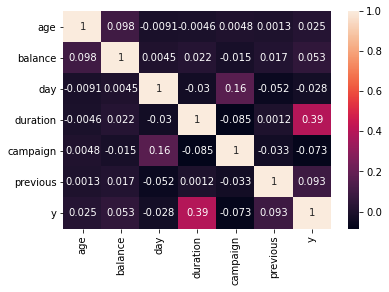

In [40]:
bank_num = bank.copy()
bank_num.y = np.where(bank.y == 'yes', 1, 0)
sns.heatmap(bank_num.corr(), annot=True)

Duration lumayan berkorelasi dengan target

## Conclusion

1. Memperbanyak penawaran ke nasabah yang berumur 30an dan diatas 60 tahun atau yang sudah pensiun.
1. Atur strategi marketing untuk menawarkan nasabah yang berprofesi sebagai siswa dan lebih fokus kepada management serta teknisi.
1. Perbanyak juga jumlah marketing ke nasabah yang belum menikah.
1. Lebih gencar marketing pada bulan Oktober, Maret, September dan Desember.
1. Targetkan nasabah yang tidak punya masalah kredit dan hutang.
1. Untuk menghemat waktu dan biaya, disarankan menghubungi nasabah tidak lebih dari 6 kali.
1. Hubungi lagi nasabah yang berhasil subscribe pada kampanye sebelumnya, dan lebih banyak menghubungi nasabah yang sudah dihubungi pada kampanye sebelumnya.